In [1]:
!pip install --upgrade plotly 

     |████████████████████████████████| 20.6MB 1.3MB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [2]:
import pandas as pd
import plotly.tools as tls
# import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [3]:
df = pd.read_csv("drive/MyDrive/slack_nlp/consumer_complaints.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (5,11) have mixed types.Specify dtype option on import or set low_memory=False.



In [4]:
df['date_received'] = pd.to_datetime(df['date_received'])
df['year_received'], df['month_received'] = df['date_received'].dt.year, df['date_received'].dt.month
df.head()

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id,year_received,month_received
0,2013-08-30,Mortgage,Other mortgage,"Loan modification,collection,foreclosure",NaN,NaN,NaN,U.S. Bancorp,CA,95993,NaN,NaN,Referral,09/03/2013,Closed with explanation,Yes,Yes,511074,2013,8
1,2013-08-30,Mortgage,Other mortgage,"Loan servicing, payments, escrow account",NaN,NaN,NaN,Wells Fargo & Company,CA,91104,NaN,NaN,Referral,09/03/2013,Closed with explanation,Yes,Yes,511080,2013,8
2,2013-08-30,Credit reporting,NaN,Incorrect information on credit report,Account status,NaN,NaN,Wells Fargo & Company,NY,11764,NaN,NaN,Postal mail,09/18/2013,Closed with explanation,Yes,No,510473,2013,8
3,2013-08-30,Student loan,Non-federal student loan,Repaying your loan,Repaying your loan,NaN,NaN,"Navient Solutions, Inc.",MD,21402,NaN,NaN,Email,08/30/2013,Closed with explanation,Yes,Yes,510326,2013,8
4,2013-08-30,Debt collection,Credit card,False statements or representation,Attempted to collect wrong amount,NaN,NaN,Resurgent Capital Services L.P.,GA,30106,NaN,NaN,Web,08/30/2013,Closed with explanation,Yes,Yes,511067,2013,8


# Memory Reduction


In [5]:
# skmem.MemReducer
# Smart memory reduction for pandas.

# A transformer to quickly reduce dataframe memory by converting memory-hungry
# dtypes to ones needing less memory. Advantages include:
#     - Fully compatible with scikit-learn. Easy to integrate with other 
#       transformers and pipelines.
#     - Preserves data integrity. Set simple parameters to control
#       treatment of floats and objects.
#     - Easy to customize. Use class inheritance or directly change modular
#       functions as needed.
#     - Efficient. Save time with vectorized functions that process data
#       faster than most parallelized solutions.

# The latest version includes transformation to pandas nullable integer types. 
# By default, pandas read functions will cast columns as float64 if there are null
# values, even if the values present are integers. The new data types Int64,
# Int32, etc. can be used in columns with null values to save memory. Transforming
# columns to nullable types is optional since some packages don't handle them.

# The main() function below has examples using Kaggle datasets. See the log 
# for results.


import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils import validation


class MemReducer(BaseEstimator, TransformerMixin):
    """ Converts dataframe columns to dtypes requiring less memory. Returns a
    dataframe with memory-efficient dtypes where possible.

    Integers, 64-bit floats and objects/strings can be converted.
    Parameters provide control for treatment of floats and objects.

    Parameters
    ___________
    max_unique_pct : float, optional, default=0.5
        Sets maximum threshold for converting object columns to categoricals.
        Threshold is compared to the number of unique values as a percent of
        column length. 0.0 prevents all conversions and 1.0 allows all
        conversions.

    nullables: boolean, optional, default=False
        Specifies whether to convert float columns with all whole numbers and
        null values into pandas nullable integers.

    Example
    --------
    >>> import skmem
    >>> df = pd.DataFrame({'cat': np.tile(['a', 'b'], 500_000),
                'true_int': np.tile(np.arange(-5, 5), 100_000),
                'float': np.arange(0., 1_000_000.),
                'nullable': np.tile([np.nan, 1, 1, 2, 3], 200_000)
                })
    >>> print(df.dtypes)

    |cat     object
    |true_int    int64
    |float    float64
    |nullable    float64
    |dtype: object
    
    >>> mr = skmem.MemReducer(max_unique_pct=0.8)
    >>> df_small = mr.fit_transform(df, float_cols=['float'], nullables=True)

    |Getting memory usage.
    |Memory in: 85.83 MB
    |Starting integers.
    |Downcast 1 standard integer columns.
    |Starting floats.
    |Downcast 1 float columns.
    |Starting objects.
    |Converted 1 columns to categories.
    |Starting nullables.
    |Converted 1 columns to nullable types.
    |Memory out: 7.63 MB Reduction: 91.1%
    
    >>> print(df_small.dtypes)

    |cat      category
    |true_int    int8
    |float     float32
    |nullable    Int8
    |dtype: object


    Notes
    -----
    Downcasting to float dtypes below 32-bits (np.float16, np.float8)
    is not supported.
    """

    
    def __init__(self, max_unique_pct=0.2, nullables=False):
        self.max_unique_pct = max_unique_pct
        self.nullables = nullables
        
        
    def fit(self, df, float_cols='auto'):
        """ Identify dataframe and any float columns to be reduced.

        Parameters
        ----------
        df : pandas DataFrame
            The dataframe used as the basis for conversion.

        float_cols : list or str, optional, default='auto'
            A list of column names to be converted from np.float64 to
            np.float32. 'auto' selects all float columns for conversion.
        """
        
        if not isinstance(df, pd.DataFrame):
            raise TypeError(f"'{type(df).__name__}' object is not a pandas \
                    dataframe.")
        
        self.float_candidates = float_cols
        return self

    
    # Helper functions for .transform()
    def reduce_ints(self, df):
        int_cols = df.select_dtypes('integer').columns
        if not int_cols.empty:
            print("Starting integers.", flush=True)
            start_types = df[int_cols].dtypes

            mins = df[int_cols].min()
            unsigneds = mins.index[mins >= 0]
            df[unsigneds] = df[unsigneds].apply(pd.to_numeric,
                                                downcast='unsigned')
            signeds = mins.index[mins < 0]
            df[signeds] = df[signeds].apply(pd.to_numeric,
                                            downcast='signed')
            end_types = df[int_cols].dtypes
            changed = end_types[~end_types.eq(start_types)]
            print(f"Downcast {len(changed)} standard integer columns.")
        return df

    
    def reduce_floats(self, df, float_cols):
        print("Starting floats.", flush=True)
        print(float_cols)
        if not isinstance(float_cols, list) and float_cols != 'auto':
            print(f"'{type(float_cols).__name__}' object is not a list or auto,"
                   " skipping floats.")
        else:
            true_float_cols = df.select_dtypes(np.float64).columns.tolist()
            non_float64s = [f for f in float_cols if f not in true_float_cols]
            if non_float64s:
                print("Skipping columns that are not np.float64")

            if float_cols == 'auto':
                convertibles = true_float_cols
            else:
                convertibles = [f for f in float_cols if f in true_float_cols]
            if convertibles:
                df[convertibles] = df[convertibles].astype(np.float32)
                print(f"Downcast {len(convertibles)} float columns.")
        return df
    
    
    def reduce_objs(self, df, max_pct):   
        if not 0<=max_pct<=1:
            raise ValueError("max_unique_pct must be between 0 and 1")

        obj_cols = df.select_dtypes('object').columns
        if not obj_cols.empty:
            print("Starting objects.", flush=True)
            for oc in obj_cols:
                try:
                    df[oc] = pd.to_numeric(df[oc], downcast='integer')
                except:
                    pass
                else: 
                    print(f"Converted {len(oc)} columns to numbers.")
                    
        new_obj_cols = df.select_dtypes('object').columns    
        if not new_obj_cols.empty:
            category_mask = df[new_obj_cols].nunique().to_numpy()/len(df) <= max_pct
            cat_cols = new_obj_cols[category_mask]
            if not cat_cols.empty:
                df[cat_cols] = df[cat_cols].astype('category')
                print(f"Converted {len(cat_cols)} columns to categories.")
        return df
    
    
    def reduce_nullables(self, df):
        print("Starting nullables.", flush=True)
        
        true_float_cols = df.select_dtypes('float').columns
        remainders = df[true_float_cols].mod(1).max(axis=0)
        nulls = df[true_float_cols].isnull().sum()
        
        convertibles = remainders[remainders==0].index \
                        .intersection(nulls[nulls!=0].index) \
                        .tolist()
        if convertibles:
            start_types = df[convertibles].dtypes
            df[convertibles] = df[convertibles].convert_dtypes()
            end_types = df[convertibles].dtypes

            changed = end_types[~end_types.eq(start_types)]                     
            changed_nums = changed[end_types!='string'].index
                        
            #TODO: change ifs and loops to np.arrays or similar
            #       and add in unsigned ints
            
            for cc in changed_nums:  
                max_int = df[cc].abs().max()
                if 32767 < max_int <=  2147483647:
                    df[cc] = df[cc].astype('Int32')
                elif 127 < max_int <= 32767:
                    df[cc] = df[cc].astype('Int16')
                elif max_int <= 127:
                    df[cc] = df[cc].astype('Int8')
                    
            print(f"Converted {len(changed)} columns to nullable types.")
        
        else:
            print("No candidates for nullable integers.")

        return df

    
    def transform(self, df):
        """ Convert dataframe columns to dtypes requiring lower memory.

        Parameters
        ----------
        df : pandas DataFrame
            The dataframe to be converted.
        """

        validation.check_is_fitted(self, 'float_candidates')

        print("Getting memory usage.")
        memory_MB_in = df.memory_usage(deep=True).sum()/(1024**2)
        print(f"Memory in: {memory_MB_in:.2f} MB")
        
        df = self.reduce_ints(df)
        if self.float_candidates:
            df = self.reduce_floats(df, self.float_candidates)
        df = self.reduce_objs(df, self.max_unique_pct)
        
        if self.nullables:
            print('Converting nullables is disabled at this time')
#             df = self.reduce_nullables(df)

        memory_MB_out = df.memory_usage(deep=True).sum()/(1024**2)
        print(f"Memory out: {memory_MB_out:.2f} MB",
              f"Reduction: {1 - memory_MB_out/memory_MB_in:.1%}\n")

        return df

    
def main():
    """skmem is designed to be a utility script. This function helps with testing
    and demonstrates how it works when run directly.
    """
    
#     import dask.dataframe as dd  # used to read the large restaruant dataframe
    
    
# #     # Predict Future Sales
# #     print("\nReading a dataframe with many text categories.")
# #     df1 = pd.read_csv('../input/consumer-complaint-database/rows.csv')
# #     mr = MemReducer(max_unique_pct=0.33)  # set threshold for converting to categoricals
# #     df1 = mr.fit_transform(df1)
    
    
#     # Big Five Personality Test
#     print("Reading 1M+ rows with many null values.")
#     df2 = pd.read_csv('../input/big-five-personality-test/IPIP-FFM-data-8Nov2018/data-final.csv',
#                       sep='\t', na_values="NONE")
#     mr = MemReducer(nullables=True)
#     df2 = mr.fit_transform(df2, float_cols=['lat_appx_lots_of_err', 'long_appx_lots_of_err'])
    
#     df2b = pd.read_csv('../input/big-five-personality-test/IPIP-FFM-data-8Nov2018/data-final.csv',
#                       sep='\t', na_values="NONE")
#     mr = MemReducer()
#     df2b = mr.fit_transform(df2b, float_cols='auto')
    

#     # Restaurant Recommendation Challenge
#     print("Reading a large dataframe.")
#     df3 = dd.read_csv('../input/restaurant-recommendation-challenge/train_full.csv', 
#                          low_memory=False).compute()
#     mr = MemReducer()
#     df3 = mr.fit_transform(df3, float_cols=['latitude_x', 'longitude_x'])
    

if __name__=="__main__":
    main()

In [6]:
mr = MemReducer()
df = mr.fit_transform(df)

Getting memory usage.
Memory in: 591.90 MB
Starting integers.
Downcast 3 standard integer columns.
Starting floats.
auto
Skipping columns that are not np.float64
Starting objects.
Converted 16 columns to categories.
Memory out: 94.78 MB Reduction: 84.0%



# EDA

In [7]:
product_proportions = df['product'].value_counts()
labels = list(product_proportions.index)
values = list(product_proportions.values)

product_pie = go.Bar(x=labels, y=values)

layout = go.Layout(title='Product Types')

fig = go.Figure(data=[product_pie], layout=layout)
iplot(fig)

In [8]:
response_proportions = df['company_response_to_consumer'].value_counts()/len(df['company_response_to_consumer'])*100

labels = list(response_proportions.index)
values = list(response_proportions.values)

product_pie = go.Pie(labels=labels, values=values)

layout = go.Layout(title='Response Types')

fig = go.Figure(data=[product_pie], layout=layout)
iplot(fig)

In [10]:
df["timely_response"].value_counts()

Yes    541909
No      14048
Name: timely_response, dtype: int64

In [11]:
is_disputed = df["consumer_disputed?"].value_counts()

disputed_plot = go.Bar(
            x=is_disputed.index.values,
            y=is_disputed.values,
    text = 'Complaints',
    showlegend=False,
    marker=dict(
        color=['#40FF00', '#FF0000'])
    )

fig = go.Figure(data=[disputed_plot], layout=layout)
iplot(fig)

In [12]:
top5_disputed = df['company'].loc[df['consumer_disputed?'] == 'Yes'].value_counts()[:5]
top5_nodispute = df['company'].loc[df['consumer_disputed?'] == 'No'].value_counts()[:5]

top5_disputes_plot = go.Bar(
            x=top5_disputed.index.values,
            y=top5_disputed.values,
    text='Disputes',
    showlegend=False
    )

top5_nodisputes_plot = go.Bar(
            x=top5_nodispute.index.values,
            y=top5_nodispute.values,
    text='No Disputes',
    showlegend=False
    )

fig = tls.make_subplots(rows=1, cols=2,
                          subplot_titles=('Disputes',
                                         'No Disputes'))

# First three Subplots
fig.append_trace(top5_disputes_plot , 1, 1)
fig.append_trace(top5_nodisputes_plot , 1, 2)



fig['layout'].update(showlegend=True, height=600, width=800, title='Sectors')
iplot(fig, filename='Complaints')

/usr/local/lib/python3.7/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [14]:
top5_response = df['company'].loc[df['timely_response'] == 'Yes'].value_counts()[:10]
top5_noresponse = df['company'].loc[df['timely_response'] == 'No'].value_counts()[:10]

top5_response_plot = go.Bar(
            x=top5_response.index.values,
            y=top5_response.values,
    text='Responses',
    showlegend=False
    )

top5_noresponse_plot = go.Bar(
            x=top5_noresponse.index.values,
            y=top5_noresponse.values,
    text='No Responses',
    showlegend=False
    )

fig = tls.make_subplots(rows=1, cols=2,
                          subplot_titles=('Responses',
                                         'No Responses'))

# First three Subplots
fig.append_trace(top5_response_plot , 1, 1)
fig.append_trace(top5_noresponse_plot , 1, 2)



fig['layout'].update(showlegend=True, height=600, width=800, title='Sectors')
iplot(fig, filename='responses')

/usr/local/lib/python3.7/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [16]:
year_groups = df.groupby(['year_received'])['company'].apply(lambda x: x.value_counts())
d = {'CRM': year_groups}

year_crm = pd.DataFrame(data=d).reset_index()
crm_df = year_crm.rename(columns={"level_1": "company"})

boa_disputes = crm_df.loc[(crm_df['company'] == 'Bank of America')]
wfc_disputes = crm_df.loc[(crm_df['company'] == 'Wells Fargo & Company')]
jp_disputes = crm_df.loc[(crm_df['company'] == 'JPMorgan Chase & Co.')]
equi_disputes = crm_df.loc[(crm_df['company'] == 'Equifax')]
citi_disputes = crm_df.loc[(crm_df['company'] == 'Citibank')]

In [17]:
# Implementing line chart (top 5 companies with complaints)
boa_disputes_amount = boa_disputes['CRM'].values.tolist()
wfc_disputes_amount = wfc_disputes['CRM'].values.tolist()
jp_disputes_amount = jp_disputes['CRM'].values.tolist()
equi_disputes_amount = equi_disputes['CRM'].values.tolist()
citi_disputes_amount = citi_disputes['CRM'].values.tolist()

# Text to add
boa_text = [str(dis) + '\n Complaints'  for dis in boa_disputes_amount]
wfc_text = [str(wfc) + '\n Complaints'  for wfc in wfc_disputes_amount]
jp_text = [str(jp) + '\n Complaints' for jp in jp_disputes_amount]
equi_text = [str(equi) + '\n Complaints' for equi in equi_disputes_amount]
citi_text = [str(citi) + '\n Complaints' for citi in citi_disputes_amount]

years = ["2011", "2012", "2013", "2014", "2015", "2016"]

boa_disputes_chart = go.Scatter(
    x=years,
    y=boa_disputes_amount,
    text=boa_text,
    name='Bank of America', 
    hoverinfo='x+text',
    mode='lines',
    line=dict(width=1,
             color='rgb(0, 22, 235)',
             ),
    fill='tonexty'
)

wfc_disputes_chart = go.Scatter(
    x=years,
    y=wfc_disputes_amount,
    text=wfc_text,
    name="Wells Fargo & Company", 
    hoverinfo='x+text',
    mode='lines',
    line=dict(width=1,
             color='rgb(275, 170, 0)',
             ),
    fill='tonexty'
)


jp_disputes_chart = go.Scatter(
    x=years,
    y=jp_disputes_amount,
    text=jp_text,
    name='JP Morgan Chase & Co.',
    hoverinfo='x+text',
    mode='lines',
    line=dict(width=1,
             color='rgb(128, 128, 128)',
             ),
    fill='tonexty'
)

equi_disputes_chart = go.Scatter(
    x=years,
    y=equi_disputes_amount,
    text=equi_text,
    name='Equifax',
    hoverinfo='x+text',
    mode='lines',
    line=dict(width=1,
             color='rgb(175, 0, 0)',
             ),
    fill='tonexty'
)

citi_disputes_chart = go.Scatter(
    x=years,
    y=citi_disputes_amount,
    text=citi_text,
    name='CitiBank',
    hoverinfo='x+text',
    mode='lines',
    line=dict(width=1,
             color='rgb(0, 215, 215)',
             ),
    fill='tonexty'
)

data = [boa_disputes_chart, wfc_disputes_chart, jp_disputes_chart, equi_disputes_chart, citi_disputes_chart]

layout = dict(title = 'Number of Complaints <br> (Top 5 Companies)',
              xaxis = dict(title = 'Year'),
              yaxis = dict(title = 'Number of Complaints')
             )


fig = dict(data=data, layout=layout)


iplot(fig, filename='basic-area-no-bound')

In [19]:
scl = [[0.0, '#ffffff'],[0.2, '#ff9999'],[0.4, '#ff4d4d'], \
       [0.6, '#ff1a1a'],[0.8, '#cc0000'],[1.0, '#4d0000']] # reds
   

data_slider = []
years = [2011, 2012, 2013, 2014, 2015, 2016]
selected_df = df.groupby(["year_received"])['state'].apply(lambda x: x.value_counts())
d = {'complaint_by_state': selected_df}
state_year = pd.DataFrame(data=d).reset_index()
state_year = state_year.rename(columns={"level_1": "state"})

for year in years:
    selected_df = state_year[state_year["year_received"]==year]
    scl = [[0.0, '#ffffff'],[0.2, '#ff9999'],[0.4, '#ff4d4d'], 
          [0.6, '#ff1a1a'],[0.8, '#cc0000'],[1.0, '#4d0000']]

    for col in selected_df.columns:
        selected_df[col] = selected_df[col].astype(str)

    selected_df['text'] = selected_df['state']+" ,total Complaints: "+selected_df["complaint_by_state"]

    data = dict(
                type='choropleth', # type of map-plot
                colorscale = scl,
                autocolorscale = False,
                locations = selected_df['state'], # the column with the state
                z = selected_df['complaint_by_state'].astype(float), # the variable I want to color-code
                locationmode = 'USA-states',
                text = selected_df['text'], # hover text
                marker = dict(     # for the lines separating states
                            line = dict (
                                      color = 'rgb(255,255,255)', 
                                      width = 2) ),               
                colorbar = dict(
                            title = "Complaints by State")
                ) 
          

    data_slider.append(data)  # I add the dictionary to the list of dictionaries for the slider
steps = []

for i in range(len(data_slider)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data_slider)],
                label='Year {}'.format(i + 2011)) # label to be displayed for each step (year)
    step['args'][1][i] = True
    steps.append(step)


	
##  I create the 'sliders' object from the 'steps' 

sliders = [dict(active=0, pad={"t": 1}, steps=steps)]  
layout = dict(geo=dict(scope='usa',
                       projection={'type': 'albers usa'}),
              sliders=sliders)


	
# I create the figure object:

fig = dict(data=data_slider, layout=layout) 

	
iplot(fig, filename='allyear_state')

In [20]:
scl = [[0.0, '#ffffff'],[0.2, '#ff9999'],[0.4, '#ff4d4d'],[0.6, '#ff1a1a'],[0.8, '#cc0000'],[1.0, '#4d0000']] # reds
   

data_slider = []
products = df["product"].unique()
selected_df = df.groupby(["product"])['state'].apply(lambda x: x.value_counts())
d = {'complaint_by_product': selected_df}
state_product = pd.DataFrame(data=d).reset_index()
state_product = state_product.rename(columns={"level_1": "state"})


for product in products:
  selected_df = state_product[state_product["product"]==product]
  scl = [[0.0, '#ffffff'],[0.2, '#ff9999'],[0.4, '#ff4d4d'], 
        [0.6, '#ff1a1a'],[0.8, '#cc0000'],[1.0, '#4d0000']]

  for col in selected_df.columns:
      selected_df[col] = selected_df[col].astype(str)

  selected_df['text'] = selected_df['state']+" ,total Complaints: "+selected_df["complaint_by_product"]

  data = dict(
              type='choropleth', # type of map-plot
              colorscale = scl,
              autocolorscale = False,
              locations = selected_df['state'], # the column with the state
              z = selected_df['complaint_by_product'].astype(float), # the variable I want to color-code
              locationmode = 'USA-states',
              text = selected_df['text'], # hover text
              marker = dict(     # for the lines separating states
                          line = dict (
                                    color = 'rgb(255,255,255)', 
                                    width = 2) ),               
              colorbar = dict(
                          title = "Complaints by State")
              ) 
        

  data_slider.append(data)  # I add the dictionary to the list of dictionaries for the slider
steps = []

for i in range(len(data_slider)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data_slider)],
                label='{}'.format(products[i])) # label to be displayed for each step (year)
    step['args'][1][i] = True
    steps.append(step)


	
##  I create the 'sliders' object from the 'steps' 

sliders = [dict(active=0, pad={"t": 1}, steps=steps)]  
layout = dict(geo=dict(scope='usa',
                       projection={'type': 'albers usa'}),
              sliders=sliders)


	
# I create the figure object:

fig = dict(data=data_slider, layout=layout) 

	
iplot(fig, filename='allyear_state')

In [22]:
import plotly.express as px

top_comps = (
    df.groupby("company")["year_received"]
    .count()
    .sort_values(ascending=False)[:10]
    .index
)

top_comps_df = df[df["company"].isin(top_comps)]


fig = px.histogram(top_comps_df, x='year_received', template='plotly_white', title='Complaint counts by date'
                   , color='company', nbins=6, log_y=True, barmode='group')


fig.update_xaxes(categoryorder="total descending").update_yaxes(
    title="Number of complaints"
)
fig.update_layout(width=1200, height=500)
fig.show()

# OLD EDA DONE

In [24]:
df = df[df["consumer_complaint_narrative"].notna()]

In [25]:
def word_len(x):
  if type(x) is float:
    return 0
  return len(x)

df["words"] = df["consumer_complaint_narrative"].map(lambda x: word_len(x))
df.head()

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id,year_received,month_received,words
190126,2015-03-19,Debt collection,"Other (i.e. phone, health club, etc.)",Cont'd attempts collect debt not owed,Debt was paid,XXXX has claimed I owe them {$27.00} for XXXX ...,NaN,"Diversified Consultants, Inc.",NY,121XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,No,1290516,2015,3,299
190135,2015-03-19,Consumer Loan,Vehicle loan,Managing the loan or lease,NaN,Due to inconsistencies in the amount owed that...,NaN,M&T Bank Corporation,VA,221XX,Servicemember,Consent provided,Web,03/19/2015,Closed with explanation,Yes,No,1290492,2015,3,1319
190155,2015-03-19,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure",NaN,In XX/XX/XXXX my wages that I earned at my job...,NaN,Wells Fargo & Company,CA,946XX,NaN,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1290524,2015,3,3550
190207,2015-03-19,Mortgage,Conventional fixed mortgage,"Loan servicing, payments, escrow account",NaN,I have an open and current mortgage with Chase...,NaN,JPMorgan Chase & Co.,CA,900XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1290253,2015,3,441
190208,2015-03-19,Mortgage,Conventional fixed mortgage,Credit decision / Underwriting,NaN,XXXX was submitted XX/XX/XXXX. At the time I s...,NaN,Rushmore Loan Management Services LLC,CA,956XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1292137,2015,3,1528


In [26]:
fig = px.histogram(df, x='words', template='plotly_white', title='Complaints word length')

fig['layout'].update(showlegend=True, height=600, width=800, title='Complaints word length')
iplot(fig, filename='Complaints')

In [27]:
import plotly.express as px

L = df["company"].value_counts().head(10).index

selected = df[df['company'].isin(L)]

fig = px.treemap(selected, path=['company', 'product'],
                 values='words',
                 color='product')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [28]:
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import ToktokTokenizer
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

def standardize_text(df, text_field):
    df[text_field] = df[text_field].str.replace(r"\n", "")
    df[text_field] = df[text_field].str.replace(r"http\S+", "")
    df[text_field] = df[text_field].str.replace(r"http", "")
    df[text_field] = df[text_field].str.replace(r"@\S+", "")
    df[text_field] = df[text_field].str.replace(r"[^A-Za-z]+",' ')
    df[text_field] = df[text_field].str.lower()
    return df
    
lemma=WordNetLemmatizer()
token=ToktokTokenizer()


def removeTags(data):
  soup=BeautifulSoup(data,"html.parser")
  text=soup.get_text()
  return text

def lemitizeWords(text):
  words=token.tokenize(text)
  listLemma=[]
  for w in words:
    x=lemma.lemmatize(w,"v")
    listLemma.append(x)
  return listLemma

def stopWordsRemove(text):
  stopWordList=stopwords.words("english")
  stopWordList.append("xxxx")
  stopWordList.append("xxx")
  stopWordList.append("xx")
  removedList=[x for x in text if not x in stopWordList]

  # return " ".join(removedList)
  
  return removedList


df = standardize_text(df, "consumer_complaint_narrative")
df["text"] = df["consumer_complaint_narrative"].map(lambda x: lemitizeWords(x))
df["text"] = df["text"].map(lambda x: stopWordsRemove(x))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
# df.to_csv("drive/MyDrive/slack_nlp/clean_complaints.csv")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



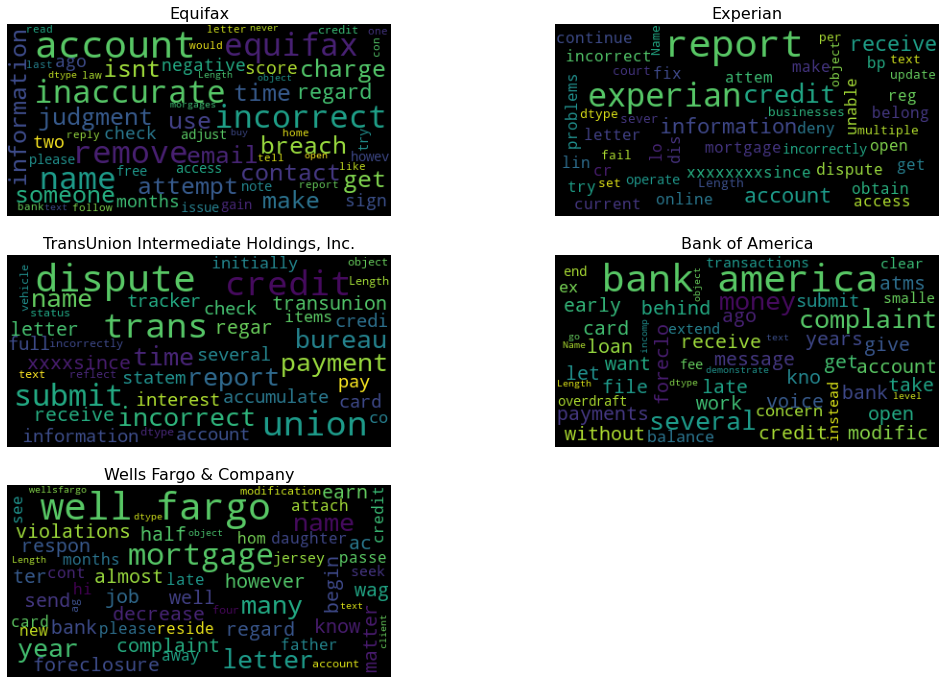

In [29]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

companies = df["company"].value_counts().index[:5]
fig = plt.figure(figsize=(18,12))
plt.subplot(3, 2, 1)

for i, company in enumerate(companies):
  wc = WordCloud(
      background_color='black',
      stopwords=set(stopwords.words("english")),
      max_words=200,
      max_font_size=40, 
      random_state=42
      ).generate(str(df['text'].loc[df['company'] == company])
  )
  plt.subplot(3, 2, i+1)
  plt.imshow(wc)
  plt.title(str(company), fontsize=16)
  plt.axis('off')
  

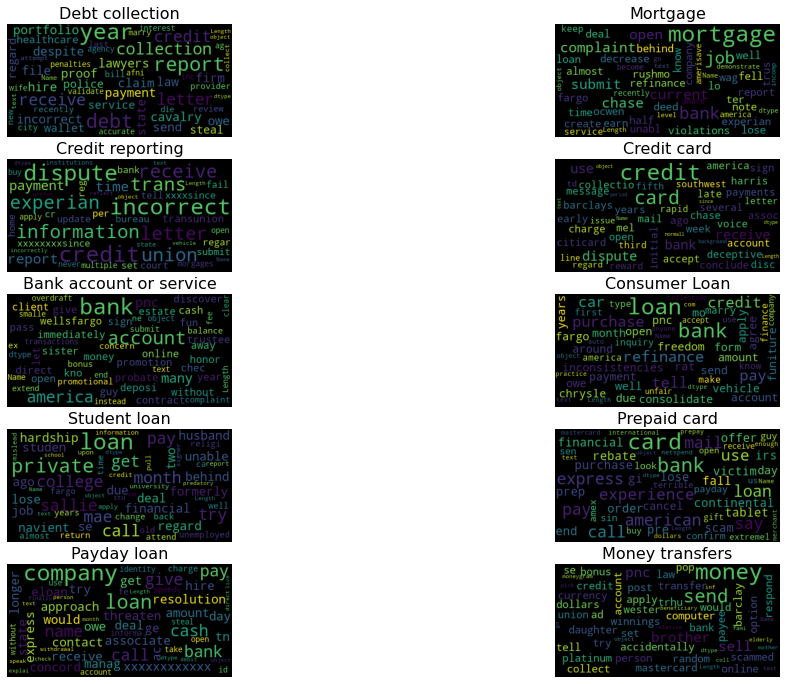

In [30]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

products = df["product"].value_counts().index[:10]
fig = plt.figure(figsize=(18,12))

for i, product in enumerate(products):
  wc = WordCloud(
      background_color='black',
      stopwords=set(stopwords.words("english")),
      max_words=200,
      max_font_size=40, 
      random_state=42
      ).generate(str(df['text'].loc[df['product'] == product])
  )
  plt.subplot(5, 2, i+1)
  plt.imshow(wc)
  plt.title(str(product), fontsize=16)
  plt.axis('off')
  

In [31]:
import nltk

def bigrams(x):
  if x is not None and x!=[]:
    return list(nltk.bigrams(x))

df['bigrams'] = df['text'].apply(lambda x: bigrams(x))

In [32]:
def flatten(L):
  L2 = []
  for x in L:
    for xx in x:
      L2.append(xx)
  return L2

words = flatten(df['text'].tolist())

In [33]:
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:12]
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:12]

Text(0.5, 0, '# of Occurances')

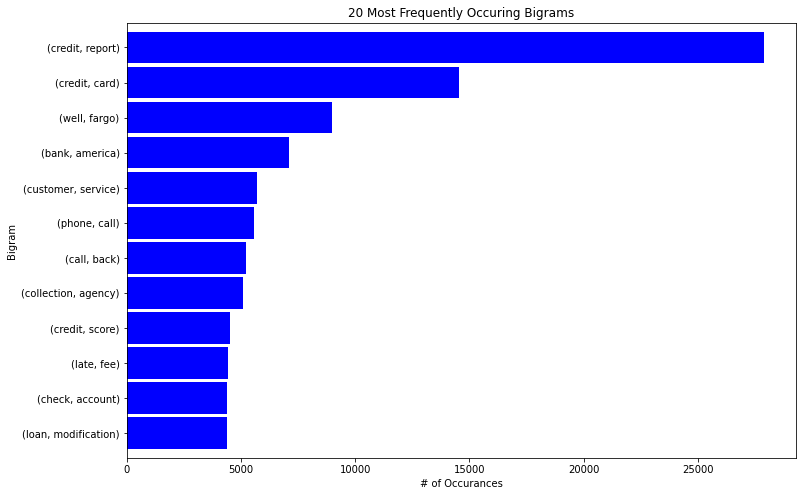

In [34]:
import matplotlib.pyplot as plt

bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

Text(0.5, 0, '# of Occurances')

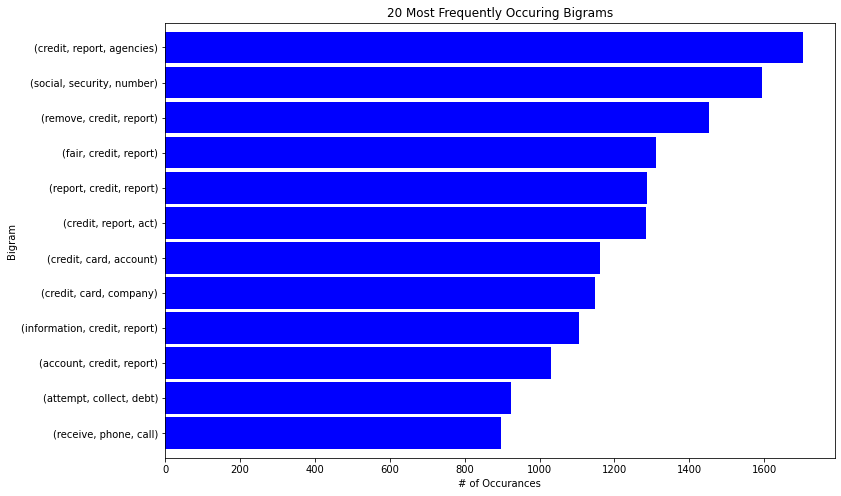

In [35]:
trigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

In [39]:
from textblob import TextBlob

def join_text(x):
  return " ".join(x)

df["joined_text"] = df["text"].apply(lambda x:join_text(x))
df['polarity']=df['joined_text'].apply(lambda x:TextBlob(x).sentiment.polarity)

In [37]:
df['polarity2']=df['consumer_complaint_narrative'].apply(lambda x:TextBlob(x).sentiment.polarity)

In [40]:
print("3 Random Complaints with Highest Polarity:")
for index,review in enumerate(df.loc[df['polarity'].sort_values(ascending=False)[:3].index]['consumer_complaint_narrative']):
  print('Review {}:\n'.format(index+1),review)

3 Random Complaints with Highest Polarity:
Review 1:
 i want to get a perfect credit score so i want to know the credit bureaus formulas i have a lower credit score because they wo n t tell me what the formula is 
Review 2:
 hello i am disputing the charge of charged on xxxx xxxx by merchant xxxx xxxx with my bank bancorp south for detailed information please refer to the attached document best regards xxxx xxxx 
Review 3:
 i received the recorded call on a sunday our credit is perfect and we do not owe anyone i am tired of these scams calling and want them to stop the company was portfolio recovery and we have never done business with them before 


In [41]:
print("3 Random Complaints with Lowest Polarity:")
for index,review in enumerate(df.loc[df['polarity'].sort_values(ascending=True)[:3].index]['consumer_complaint_narrative']):
  print('Review {}:\n'.format(index+1),review)

3 Random Complaints with Lowest Polarity:
Review 1:
 northstar location services has contacted me xxxx times and told me that they are looking for my mother who owes a debt my mother did not give my cell phone to them i do not know how they found my cell phone they are nasty on the phone 
Review 2:
 palisades collection is attempting to collect a debt that was discharged they are harassing me at my workplace and at home it appears that they know the ramifications but they are persistent and they are sneaky and nasty and intrusive with their ploys 
Review 3:
 yes the credit dept say the company ask them to keep the fraud on my report in have me company them i have contact them a number of times in this has n t not been remove from my credit file which makes this more outrageous is i have been on xxxx since i was born in xxxx and xxxx both pay all my health care bills on by somebody use my name in a fraud this bill was n t pay for but the collection agent trying force me to pay something

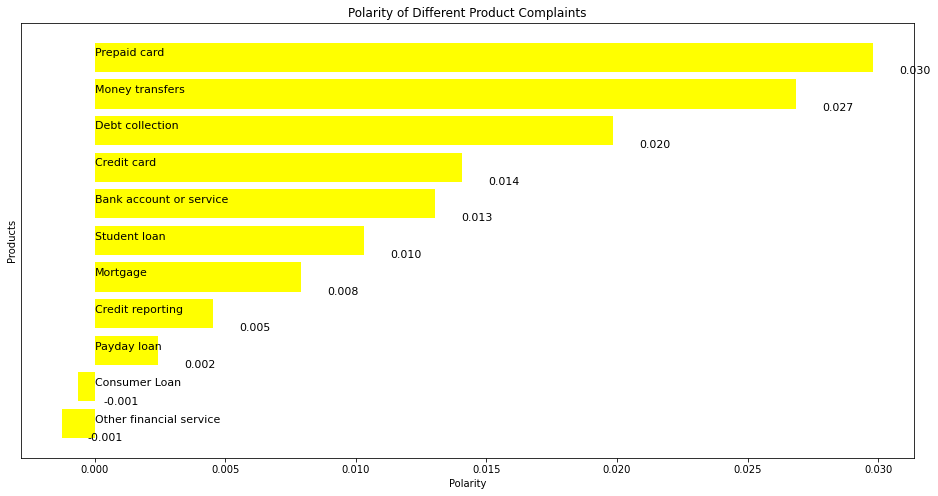

In [42]:
product_polarity_sorted=pd.DataFrame(df.groupby('product')['polarity'].mean().sort_values(ascending=True))

plt.figure(figsize=(16,8))
plt.xlabel('Polarity')
plt.ylabel('Products')
plt.title('Polarity of Different Product Complaints')
polarity_graph=plt.barh(np.arange(len(product_polarity_sorted.index)),product_polarity_sorted['polarity'],color='yellow',)
# Writing product names on bar
for bar,product in zip(polarity_graph,product_polarity_sorted.index):
  plt.text(0.00,bar.get_y()+bar.get_width()+0.5,'{}'.format(product),va='center',fontsize=11,color='black')
  # Writing polarity values on graph
for bar,polarity in zip(polarity_graph,product_polarity_sorted['polarity']):
  plt.text(bar.get_width()+0.001,bar.get_y()+bar.get_width(),'%.3f'%polarity,va='center',fontsize=11,color='black')
plt.yticks([])
plt.show()

# CLASSIFICATION

In [ ]:
!pip install lime

In [76]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
import lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

In [53]:
uniques = list(df["product"].unique())
label_enc = dict(zip(uniques, [i for i in range(len(uniques))]))

df["product_labels"]=df["product"].apply(lambda x:label_enc[x])
df.head(3)

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id,year_received,month_received,words,text,bigrams,joined_text,polarity2,polarity,product_labels
190126,2015-03-19,Debt collection,"Other (i.e. phone, health club, etc.)",Cont'd attempts collect debt not owed,Debt was paid,xxxx has claimed i owe them for xxxx years des...,NaN,"Diversified Consultants, Inc.",NY,121XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,No,1290516,2015,3,299,"[claim, owe, years, despite, proof, payment, s...","[(claim, owe), (owe, years), (years, despite),...",claim owe years despite proof payment send can...,0.000000,0.000000,0
190135,2015-03-19,Consumer Loan,Vehicle loan,Managing the loan or lease,NaN,due to inconsistencies in the amount owed that...,NaN,M&T Bank Corporation,VA,221XX,Servicemember,Consent provided,Web,03/19/2015,Closed with explanation,Yes,No,1290492,2015,3,1319,"[due, inconsistencies, amount, owe, tell, bank...","[(due, inconsistencies), (inconsistencies, amo...",due inconsistencies amount owe tell bank amoun...,0.085000,0.085000,1
190155,2015-03-19,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure",NaN,in xx xx xxxx my wages that i earned at my job...,NaN,Wells Fargo & Company,CA,946XX,NaN,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1290524,2015,3,3550,"[wag, earn, job, decrease, almost, half, know,...","[(wag, earn), (earn, job), (job, decrease), (d...",wag earn job decrease almost half know trouble...,-0.016155,-0.068434,2


In [64]:
tfidf = TfidfVectorizer(sublinear_tf=True, norm='l2', min_df=5, stop_words='english', ngram_range=(1,2))

X = tfidf.fit_transform(df.joined_text)
y = df.product_labels
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [78]:
model1 = LogisticRegression()
model1.fit(X_train, y_train)
y_pred = model1.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.858, precision = 0.855, recall = 0.858, f1 = 0.853


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [79]:
model2 = LinearSVC()
model2.fit(X_train, y_train)
y_pred = model2.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.871, precision = 0.867, recall = 0.871, f1 = 0.867


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [80]:
model3 = DecisionTreeClassifier()
model3.fit(X_train, y_train)
y_pred = model3.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.744, precision = 0.741, recall = 0.744, f1 = 0.742


In [108]:
c = make_pipeline(tfidf, model1)
class_names=list(df["product"].unique())
explainer = LimeTextExplainer(class_names=class_names)

idx = 1100
exp = explainer.explain_instance(df.joined_text.iloc[idx], c.predict_proba, num_features=6, labels=[4, 8])
print('Document id: %d' % idx)
print('Predicted class =', class_names[model1.predict(X_test[idx]).reshape(1,-1)[0,0]])
print('True class: %s' % class_names[y_test.iloc[idx]])

Document id: 1100
Predicted class = Credit reporting
True class: Credit reporting


In [109]:
print ('Explanation for class %s' % class_names[4])
print ('\n'.join(map(str, exp.as_list(label=4))))

Explanation for class Credit reporting
('debt', -0.024916722309362135)
('collect', -0.012347615698483378)
('phone', -0.009350526346133736)
('owe', -0.008909117876563677)
('stop', -0.007796562188973785)
('information', 0.005878447229843852)


In [141]:
index = 120
exp = explainer.explain_instance(df.joined_text.iloc[index], c.predict_proba, num_features=6, top_labels=2)
exp.show_in_notebook(text=False)

In [142]:
exp.show_in_notebook(text=df.joined_text.iloc[index])

# ML

In [129]:
# to be imported
from keras.preprocessing.text import text_to_word_sequence
import pandas as pd
from keras.preprocessing.text import Tokenizer
import numpy as np
from __future__ import print_function

from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers import Embedding
from keras.layers import Conv1D, GlobalMaxPooling1D

In [130]:
df = df[df["product"].notna()]

In [131]:
df.head()

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id,year_received,month_received,words,text,bigrams,joined_text,polarity2,polarity,product_labels
190126,2015-03-19,Debt collection,"Other (i.e. phone, health club, etc.)",Cont'd attempts collect debt not owed,Debt was paid,xxxx has claimed i owe them for xxxx years des...,NaN,"Diversified Consultants, Inc.",NY,121XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,No,1290516,2015,3,299,"[claim, owe, years, despite, proof, payment, s...","[(claim, owe), (owe, years), (years, despite),...",claim owe years despite proof payment send can...,0.000000,0.000000,0
190135,2015-03-19,Consumer Loan,Vehicle loan,Managing the loan or lease,NaN,due to inconsistencies in the amount owed that...,NaN,M&T Bank Corporation,VA,221XX,Servicemember,Consent provided,Web,03/19/2015,Closed with explanation,Yes,No,1290492,2015,3,1319,"[due, inconsistencies, amount, owe, tell, bank...","[(due, inconsistencies), (inconsistencies, amo...",due inconsistencies amount owe tell bank amoun...,0.085000,0.085000,1
190155,2015-03-19,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure",NaN,in xx xx xxxx my wages that i earned at my job...,NaN,Wells Fargo & Company,CA,946XX,NaN,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1290524,2015,3,3550,"[wag, earn, job, decrease, almost, half, know,...","[(wag, earn), (earn, job), (job, decrease), (d...",wag earn job decrease almost half know trouble...,-0.016155,-0.068434,2
190207,2015-03-19,Mortgage,Conventional fixed mortgage,"Loan servicing, payments, escrow account",NaN,i have an open and current mortgage with chase...,NaN,JPMorgan Chase & Co.,CA,900XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1290253,2015,3,441,"[open, current, mortgage, chase, bank, chase, ...","[(open, current), (current, mortgage), (mortga...",open current mortgage chase bank chase report ...,0.000000,0.000000,2
190208,2015-03-19,Mortgage,Conventional fixed mortgage,Credit decision / Underwriting,NaN,xxxx was submitted xx xx xxxx at the time i su...,NaN,Rushmore Loan Management Services LLC,CA,956XX,Older American,Consent provided,Web,03/19/2015,Closed with explanation,Yes,Yes,1292137,2015,3,1528,"[submit, time, submit, complaint, deal, rushmo...","[(submit, time), (time, submit), (submit, comp...",submit time submit complaint deal rushmore mor...,-0.051136,-0.026136,2


In [132]:
X = df["joined_text"].values
y = df["product"].values

In [133]:
tk = Tokenizer(num_words= 200, filters = '!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',lower=True, split=" ")
tk.fit_on_texts(X)
x = tk.texts_to_sequences(X)
x = sequence.pad_sequences(x, maxlen=200)

In [134]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

labelencoder_Y = LabelEncoder()
y = labelencoder_Y.fit_transform(y)
print(len(y))
print(np.unique(y, return_counts=True))

66806
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]), array([ 5711,  3678,  7929, 12526, 17552,   666, 14919,   110,   726,
         861,  2128]))


In [ ]:
print(y.shape)

(66806,)


In [135]:
# Perform one hot encoding 
from tensorflow.keras.utils import to_categorical
y = to_categorical(y, num_classes= 11)

print(y)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
# Seeding
np.random.seed(200)
indices = np.arange(len(x))
np.random.shuffle(indices)
x = x[indices]
y = y[indices]

In [ ]:
# split test and train data
test_split = 0.2
idx = int(len(x) * (1 - test_split))
x_train, y_train = np.array(x[:idx]), np.array(y[:idx])
x_test, y_test = np.array(x[idx:]), np.array(y[idx:])

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)
print(y)

(53444, 200)
(53444, 11)
(13362, 200)
(13362, 11)
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
x_train = sequence.pad_sequences(x_train, maxlen=201)
x_test = sequence.pad_sequences(x_test, maxlen=201)
print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)

x_train shape: (53444, 201)
x_test shape: (13362, 201)


In [ ]:
max_features = 1000
maxlen = 201
embedding_dims = 50
filters = 250
kernel_size = 3
hidden_dims = 250

# model = Sequential()
# model.add(Dense(units=1, activation='relu', input_shape = x_train.shape[1]))
# model.add(Dense(units=1, activation='relu'))
# model.add(Dense(units=1, activation='linear'))


# CNN with max pooling imeplementation 
print('Build model...')
model = Sequential()
# we start off with an efficient embedding layer which maps
# our vocab indices into embedding_dims dimensions
model.add(Embedding(max_features,
                    embedding_dims,
                    input_length=maxlen))
model.add(Dropout(0.2))

# we add a Convolution1D, which will learn filters
# word group filters of size filter_length:
model.add(Conv1D(filters,
                 kernel_size,
                 padding='valid',
                 activation='relu',
                 strides=1))
# we use max pooling:
model.add(GlobalMaxPooling1D())

# We add a vanilla hidden layer:
model.add(Dense(hidden_dims))
model.add(Dropout(0.2))
model.add(Activation('relu'))

# We project onto a single unit output layer, and squash it with a sigmoid:
model.add(Dense(11))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

model.fit(x_train, y_train,
          batch_size=32,
          epochs=20,
          validation_data=(x_test, y_test))

Build model...
Epoch 1/20
1671/1671 [==============================] - 89s 53ms/step - loss: 1.0899 - accuracy: 0.6383 - val_loss: 0.6948 - val_accuracy: 0.7776
Epoch 2/20
1671/1671 [==============================] - 87s 52ms/step - loss: 0.6966 - accuracy: 0.7764 - val_loss: 0.6651 - val_accuracy: 0.7848
Epoch 3/20
1671/1671 [==============================] - 88s 52ms/step - loss: 0.6469 - accuracy: 0.7905 - val_loss: 0.6510 - val_accuracy: 0.7887
Epoch 4/20
1671/1671 [==============================] - 88s 53ms/step - loss: 0.6186 - accuracy: 0.7982 - val_loss: 0.6424 - val_accuracy: 0.7913
Epoch 5/20
1671/1671 [==============================] - 87s 52ms/step - loss: 0.6032 - accuracy: 0.8015 - val_loss: 0.6374 - val_accuracy: 0.7942
Epoch 6/20
1671/1671 [==============================] - 87s 52ms/step - loss: 0.5850 - accuracy: 0.8094 - val_loss: 0.6348 - val_accuracy: 0.7943
Epoch 7/20
1671/1671 [==============================] - 88s 53ms/step - loss: 0.5660 - accuracy: 0.8137 - val

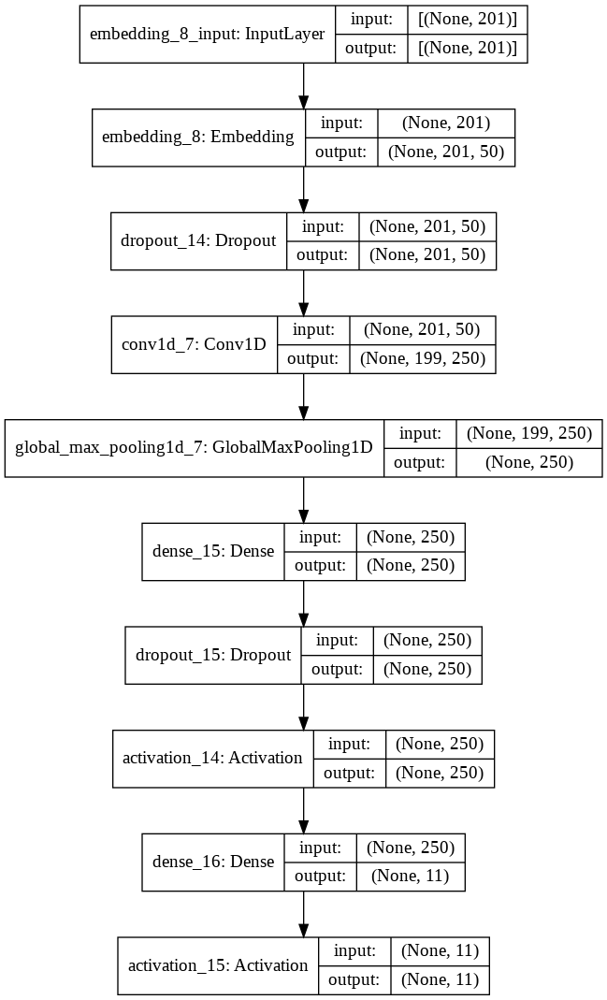

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
loss, accuracy = model.evaluate(x_train, y_train, verbose=False)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(x_test, y_test, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))

Training Accuracy: 0.8880
Testing Accuracy:  0.7959


In [ ]:
model.save("drive/MyDrive/slack_nlp/model.h5")
# import pickle

# with open('drive/MyDrive/slack_nlp/tokenizer.pickle', 'wb') as handle:
#     pickle.dump(tk, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [123]:
import keras

model = keras.models.load_model("drive/MyDrive/slack_nlp/model.h5")

In [ ]:
i=885

trial=df["consumer_complaint_narrative"].iloc[i]
print(trial)
product=df["product"].iloc[i]
print(product)

y_true = []
y_pred = []
labels = []

for i in range(2000):
  print(i)
  trial=df["consumer_complaint_narrative"].iloc[i]
  product=df["product"].iloc[i]
  y_true.append(product) 
  y_pred.append(model_predict(trial, model, tk))
  if product not in labels:
    labels.append(product)
labels  

In [127]:
def standardize_text(text):
    text = text.replace(r"\n", "")
    text = text.replace(r"http\S+", "")
    text = text.replace(r"http", "")
    text = text.replace(r"@\S+", "")
    text = text.replace(r"[^A-Za-z]+",' ')
    text = text.lower()
    return text
    
lemma=WordNetLemmatizer()
token=ToktokTokenizer()


def removeTags(data):
  soup=BeautifulSoup(data,"html.parser")
  text=soup.get_text()
  return text

def lemitizeWords(text):
  words=token.tokenize(text)
  listLemma=[]
  for w in words:
    x=lemma.lemmatize(w,"v")
    listLemma.append(x)
  return listLemma

def stopWordsRemove(text):
  stopWordList=stopwords.words("english")
  stopWordList.append("xxxx")
  stopWordList.append("xxx")
  stopWordList.append("xx")
  removedList=[x for x in text if not x in stopWordList]
  return removedList

def model_predict(to_predict, model, tk):
  trial = []
  trial.append(to_predict)
  trial[0] = standardize_text(trial[0])
  trial[0] = lemitizeWords(trial[0])
  trial[0] = stopWordsRemove(trial[0])
  trial[0] = " ".join(trial[0])

  tk.fit_on_texts(trial)
  trial = tk.texts_to_sequences(trial)

  trial = sequence.pad_sequences(trial, maxlen=200)
  trial = sequence.pad_sequences(trial, maxlen=201)

  res = model.predict(trial)

  result = labelencoder_Y.inverse_transform(res.argmax(axis=1))

  return result[0]

In [137]:
import pickle

infile = open("drive/MyDrive/slack_nlp/tokenizer.pickle",'rb')
tk = pickle.load(infile)

string = "I was surprised by the unforseen and hidden charges in my account"
model_predict(string, model, tk)

'Bank account or service'

In [ ]:
import matplotlib.pyplot as plt


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    import itertools
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [ ]:
df["product"].unique

<bound method Series.unique of 190126     Debt collection
190135       Consumer Loan
190155            Mortgage
190207            Mortgage
190208            Mortgage
                ...       
553084    Credit reporting
553085    Credit reporting
553086         Payday loan
553090            Mortgage
553096            Mortgage
Name: product, Length: 66806, dtype: object>

Confusion matrix, without normalization
[[393   8  40  14  74   5   7   3   0   0   1]
 [ 15  52  21   2  12   9   0   0   1   0   0]
 [  6  10 409   1  66   6   1   1   0   0   0]
 [ 28   3  20 150  18   2   8   0   0   0   1]
 [ 54   7  50  13 174   2   3   0   0   0   0]
 [  9  13  21   1   5  36   0   1   0   0   0]
 [  5   2  20  16  12   0  93   0   1   0   0]
 [ 12   7   5   0   1   3   0   5   0   0   0]
 [  1   0   6   2   2   0   5   0  10   0   1]
 [  1   0   1   0   1   0   0   0   0   0   0]
 [  1   0   1   4   1   0   2   0   1   0   2]]


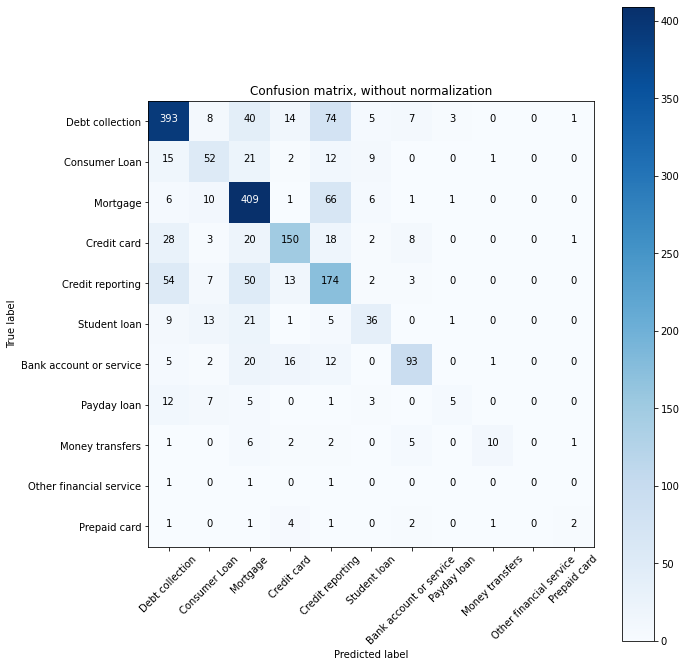

In [ ]:
from sklearn.metrics import confusion_matrix

# labels = df["product"].unique()

cnf_matrix = confusion_matrix(y_true, y_pred,labels=labels)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(10,10))
plot_confusion_matrix(cnf_matrix, classes=labels,
                      title='Confusion matrix, without normalization')